In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from catboost import CatBoostRegressor
from src.const import PATH_TO_DATA, RANDOM_STATE
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import KFold, GridSearchCV


In [11]:
#TODO выяснить почему такая разница на валидации и кагле
params = {'iterations': 450, 'learning_rate': 0.0686745027182936, 'depth': 8, 'l2_leaf_reg': 1, 'border_count': 128, 'bagging_temperature': 1, 'random_strength': 5, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 5}

In [4]:
from src.utils import load_data
df_x_train, df_y_train, df_test = load_data()

In [4]:
np.unique(df_x_train.iloc[:, 4].values)

array([0., 1.])

In [17]:
np.unique(df_x_train.iloc[:, 12].values)

array([0., 1.])

In [12]:
print('Уникальные значения:')
cols_to_convert = [4, 5, 12, 13]
for i in cols_to_convert:
    print(f'{i}: {list(np.unique(df_x_train.iloc[:, i].values))}')
    
df_x_train[cols_to_convert] = df_x_train[cols_to_convert].astype(int)
df_test[cols_to_convert] = df_test[cols_to_convert].astype(int)
print(f'{df_x_train.iloc[:, cols_to_convert].dtypes}')


Уникальные значения:


AttributeError: 'Series' object has no attribute 'values_count'

In [27]:
dublicates = [(4, 12), (5, 13), (6, 14), (7, 15)]
try:
    print('Дубликаты: ')
    for i in dublicates:
        print(f'{i}: {np.sum(df_x_train.iloc[:, i[0]] == df_x_train.iloc[:, i[1]])} из {len(df_x_train.iloc[:, 0])}')
        
    df_x_train.drop(columns=[i[0] for i in dublicates], inplace=True)
    df_test.drop(columns=[i[0] for i in dublicates], inplace=True)
    print('Дубликаты удалены')
    
except Exception:
    print('Дубликаты уже удалены')

print(df_x_train.shape[1])
assert df_x_train.shape[1] == 12

Дубликаты: 
(4, 12): 40000 из 40000
(5, 13): 40000 из 40000
(6, 14): 40000 из 40000
(7, 15): 40000 из 40000
Дубликаты удалены
12


In [25]:
df_x_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       40000 non-null  float64
 1   1       40000 non-null  float64
 2   2       40000 non-null  float64
 3   3       40000 non-null  float64
 4   4       40000 non-null  float64
 5   5       40000 non-null  float64
 6   6       40000 non-null  float64
 7   7       40000 non-null  float64
 8   8       40000 non-null  float64
 9   9       40000 non-null  float64
 10  10      40000 non-null  float64
 11  11      40000 non-null  float64
dtypes: float64(12)
memory usage: 3.7 MB


In [5]:
df_train = df_x_train.copy()
df_train['target'] = df_y_train[0]
df_train

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,target
0,0.451009,0.614606,0.167306,0.390843,0.0,2.0,6.691263,6.792145,1.185154,3.811872,0.175758,2.207100,0.0,2.0,6.691263,6.792145,32.0966
1,0.837123,0.558449,0.034198,0.839781,1.0,2.0,0.735178,0.324811,1.575394,5.370452,6.851491,2.479178,1.0,2.0,0.735178,0.324811,-26.5666
2,0.605636,0.350955,0.678408,0.568693,1.0,0.0,3.921524,6.610859,1.959624,0.698998,6.002673,0.780729,1.0,0.0,3.921524,6.610859,-26.1210
3,0.862016,0.205944,0.576584,0.198756,0.0,2.0,1.873797,4.482543,1.652851,5.640393,0.702110,2.102840,0.0,2.0,1.873797,4.482543,21.5590
4,0.586450,0.767571,0.751014,0.642278,1.0,0.0,0.926542,6.928612,1.676833,5.206752,4.588336,2.963444,1.0,0.0,0.926542,6.928612,-37.0384
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39995,0.021210,0.239534,0.804448,0.031040,0.0,1.0,4.479850,1.155407,1.135077,4.042245,5.062804,1.751091,0.0,1.0,4.479850,1.155407,2.3581
39996,0.184133,0.538483,0.621713,0.559558,1.0,1.0,4.274873,2.150110,0.953147,2.465749,0.852418,2.079482,1.0,1.0,4.274873,2.150110,-9.5478
39997,0.481143,0.707721,0.881163,0.986692,0.0,2.0,3.539984,0.942402,1.419812,2.583791,8.084675,0.251962,0.0,2.0,3.539984,0.942402,11.5962
39998,0.699566,0.908059,0.575170,0.171145,1.0,2.0,1.237075,0.816721,1.762412,1.371350,5.838254,2.515948,1.0,2.0,1.237075,0.816721,-20.2132


D:\Document\SecCourseMATMEX\ml\FirstContest\venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
D:\Document\SecCourseMATMEX\ml\FirstContest\venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
D:\Document\SecCourseMATMEX\ml\FirstContest\venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
D:\Document\SecCourseMATMEX\ml\FirstContest\venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
D:\Document\SecCourseMATMEX\ml\FirstContest\venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plo

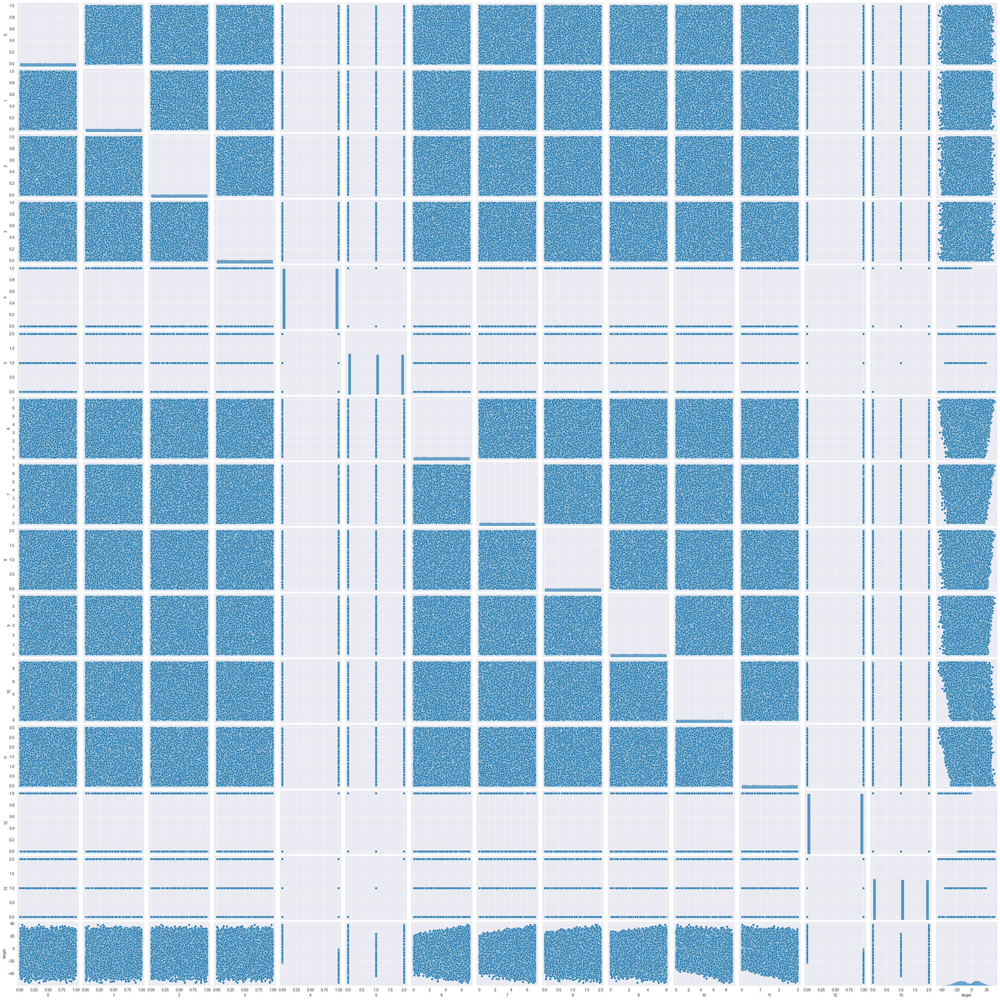

In [17]:
g = sns.pairplot(df_train, palette="Set1")

D:\Document\SecCourseMATMEX\ml\FirstContest\venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
D:\Document\SecCourseMATMEX\ml\FirstContest\venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
D:\Document\SecCourseMATMEX\ml\FirstContest\venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
D:\Document\SecCourseMATMEX\ml\FirstContest\venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
D:\Document\SecCourseMATMEX\ml\FirstContest\venv\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plo

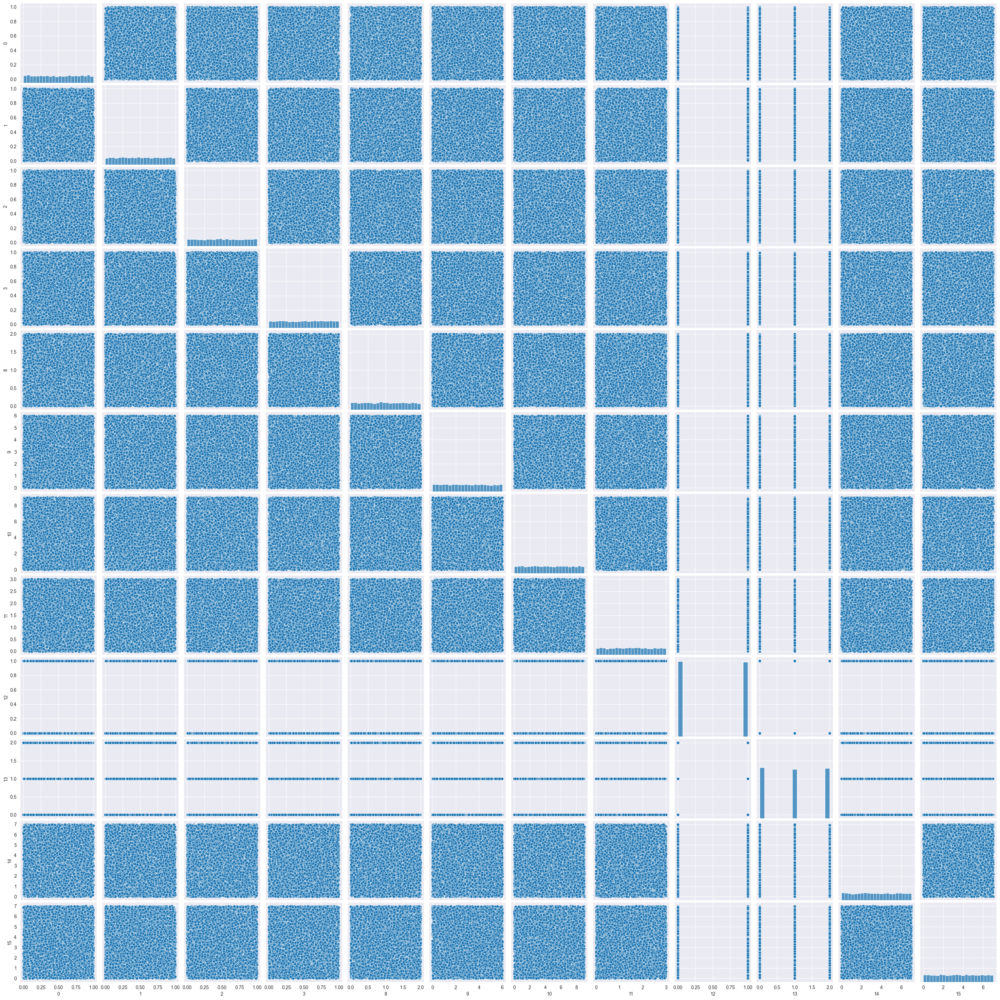

In [6]:
h = sns.pairplot(df_test, palette="Set1")

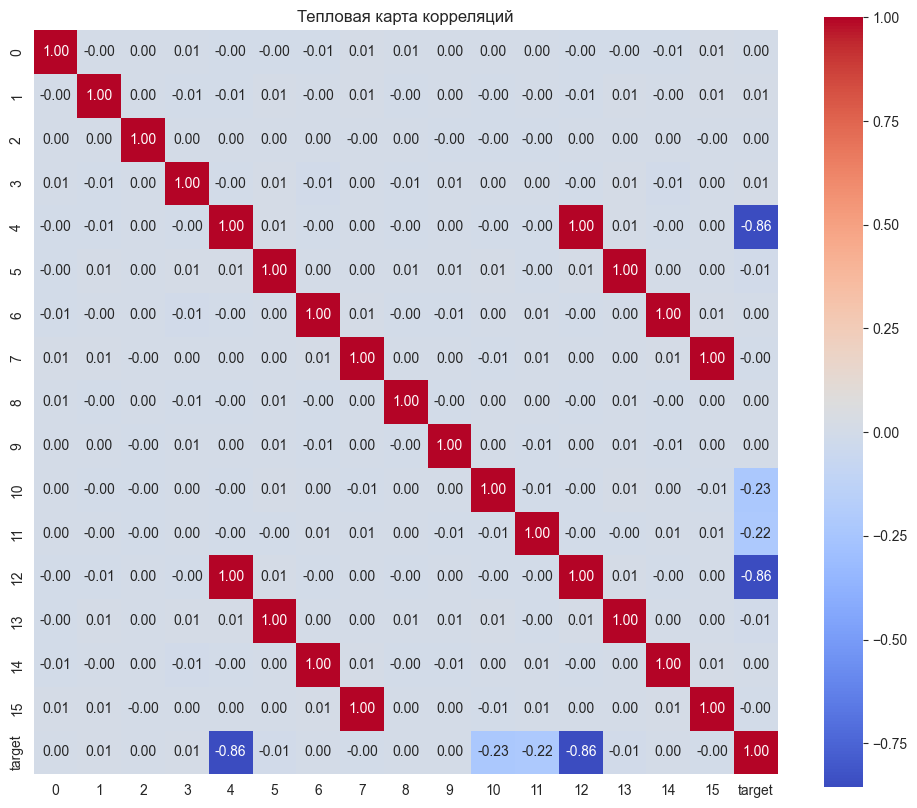

In [6]:
corr_matrix = df_train.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Тепловая карта корреляций")
plt.show()

In [21]:
def add_features(X):
    # Старые фичи (27, 28, 39, 41, 42)
    new_features = []
    
    # Фича 27: сумма по строкам
    sum_f = np.sum(X, axis=1, keepdims=True)
    new_features.append(sum_f)
    
    # Фича 28: среднее по строкам
    mean_f = np.mean(X, axis=1, keepdims=True)
    new_features.append(mean_f)
    
    # Фича 39: количество значений выше среднего
    count_above_mean = np.sum(X > mean_f, axis=1, keepdims=True)
    new_features.append(count_above_mean)
    
    # Фича 41: логарифм абсолютных значений для первых 4 признаков
    log_features = np.log1p(np.abs(X[:, :4]))
    new_features.append(log_features)
    
    # Фича 42: квадратный корень для признаков 4-8
    sqrt_features = np.sqrt(np.abs(X[:, 4:8]) + 1e-6)
    new_features.append(sqrt_features)

    # Новые преобразования для фич 10, 11, 12 (индексы 9,10,11 в X)
    f10 = X[:, 9:10]
    f11 = X[:, 10:11]
    f12 = X[:, 11:12]

    # 1. Нелинейные преобразования для f12 (корреляция -0.86)
    new_features.append(np.sqrt(np.abs(f12)))          # Фича 43
    new_features.append(f12 ** 2)                      # Фича 44

    # 2. Взаимодействие фич 10-11-12
    new_features.append(f10 * f12)                     # Фича 45
    new_features.append((f11 + f12) / (f10 + 1e-6))    # Фича 46

    # 3. Условные преобразования
    new_features.append(np.where(f12 < np.median(f12), 0, 1)) # Фича 47
    new_features.append(np.log1p(np.abs(f10 + f11)))   # Фича 48

    # 4. Агрегаты
    new_features.append((f10 + f11 + f12) / 3)         # Фича 49
    new_features.append(np.max([f10, f11, f12], axis=0)) # Фича 50

    return np.hstack([X] + new_features)


df_x_train = add_features(df_x_train.values)
df_test = add_features(df_test.values)

In [8]:
from scipy.stats import skew

from scipy.stats import kurtosis


def add_features(X):
    sum_f = np.sum(X, axis=1, keepdims=True)
    mean_f = np.mean(X, axis=1, keepdims=True)
    std_f = np.std(X, axis=1, keepdims=True)

    interactions = np.hstack([
        X[:, i:i+1] * X[:, j:j+1]
        for i in range(4)
        for j in range(i+1, 4)
    ])

    return np.hstack([
        X,
        sum_f,
        mean_f,
        std_f,
        np.max(X, axis=1, keepdims=True),
        np.min(X, axis=1, keepdims=True),
        np.median(X, axis=1, keepdims=True),
        skew(X, axis=1, keepdims=True),
        kurtosis(X, axis=1, keepdims=True),
        np.sum(X > mean_f, axis=1, keepdims=True),
        np.log1p(np.abs(X[:, :4])),
        np.sqrt(np.abs(X[:, 4:8]) + 1e-6),
        interactions,
        X[:, :4] ** 2,
        X[:, 4:8] ** 3,
        (X[:, :4] + 1e-6) / (X[:, 4:8] + 1e-6),
        np.exp(0.01 * X[:, :4])
    ])

df_x_train = add_features(df_x_train.values)
df_test = add_features(df_test.values)

In [32]:
df_x_train

array([[0.4510095 , 0.61460638, 0.16730614, ..., 1.00616499, 1.00167446,
        1.00391607],
       [0.8371234 , 0.55844869, 0.03419815, ..., 1.00560011, 1.00034204,
        1.00843317],
       [0.60563576, 0.35095504, 0.67840821, ..., 1.00351572, 1.00680715,
        1.00570313],
       ...,
       [0.4811432 , 0.70772098, 0.88116348, ..., 1.00710231, 1.00885057,
        1.00991576],
       [0.69956601, 0.90805913, 0.57516987, ..., 1.00912194, 1.00576827,
        1.00171292],
       [0.60549189, 0.11642799, 0.08077757, ..., 1.00116496, 1.0008081 ,
        1.00270294]])

In [17]:
# cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)
# 
# 
# param_grid = {
#     'iterations': [100, 200, 300],
#     'learning_rate': [0.01, 0.1, 0.2],
#     'depth': [4, 6, 8]
# }
# 
# model = CatBoostRegressor(random_state=RANDOM_STATE, verbose=0)
# 
# grid_search = GridSearchCV(estimator=model,
#                            param_grid=param_grid,
#                            scoring='neg_mean_squared_error',
#                            cv=cv,
#                            n_jobs=-1,
#                            verbose=1)
# 
# grid_search.fit(df_x_train, df_y_train[0])
# 
# best_params = grid_search.best_params_
# best_cv_mse = -grid_search.best_score_
# 
# print("Лучшие параметры:", best_params)
# print("Лучшее CV MSE:", best_cv_mse)
# model = grid_search


Fitting 5 folds for each of 27 candidates, totalling 135 fits
Лучшие параметры: {'depth': 8, 'iterations': 300, 'learning_rate': 0.1}
Лучшее CV MSE: 0.10298202559034433


In [25]:
from sklearn.model_selection import train_test_split

# X_train, X_val, y_train, y_val = train_test_split(
#     df_x_train,
#     df_y_train[0],  
#     test_size=0.2,
#     random_state=RANDOM_STATE
# )

params = {
    'iterations': 3000,
    'depth': 9,
    'learning_rate': 0.02,
    'l2_leaf_reg': 1.5,
    'random_strength': 0.3,
    'bagging_temperature': 0.5,
    'loss_function': 'RMSE',  # CatBoost не поддерживает MSE как loss!

}

cv = KFold( n_splits=5, shuffle=True, random_state=RANDOM_STATE)
model = CatBoostRegressor(**params, random_state=RANDOM_STATE, verbose=0)
scores = cross_val_score(model, df_x_train, df_y_train[0], cv=cv,
                         scoring='neg_mean_squared_error', n_jobs=-1)

cv_mse_scores = -scores
print("CV MSE scores:", cv_mse_scores)
print("Среднее CV MSE:", np.mean(cv_mse_scores))


CV MSE scores: [0.03419282 0.03188014 0.03246111 0.03385406 0.03468748]
Среднее CV MSE: 0.03341512183511294


In [18]:
model.fit(df_x_train, df_y_train[0])


MSE на валидации: 0.09 все фичи
0.07 корелированые фичи
0.033 с корелироваными много итераций

In [19]:
from src.utils import save_predictions

y_pred = model.predict(df_test)
save_predictions(y_pred)

Предсказания сохранены в: predictions\predictions_9.csv


'predictions\\predictions_9.csv'